In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
pd.set_option('max_columns', 500)

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# Data Input

In [2]:
df_raw = pd.read_csv('./data/telco_customer_churn.csv')
print(df_raw.shape)

(7043, 21)


In [3]:
# df_raw.TotalCharges = df_raw.TotalCharges.str.strip()
# df_raw.TotalCharges = df_raw.TotalCharges.astype(float)

In [4]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [5]:
print(df_raw.TotalCharges.shape)
df_raw.TotalCharges.nunique()

(7043,)


6531

In [6]:
df_raw.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

In [7]:
df_raw.isna().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [8]:
df_raw.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

## 1.	Berapakah jumlah pelanggan churn pada dataset tersebut, apakah kasus tersebut termasuk kasus imbalance data? Jelaskan alasan anda

In [9]:
df_1 = pd.DataFrame(df_raw.groupby('Churn')['Churn'].count())

df_1.rename(columns={'Churn':'Count'}, inplace = True)
df_1

,Count
Churn,
No,5174
Yes,1869


In [10]:
df_1_pct = df_1['Count']*100/(df_1['Count'].sum())
df_1_pct

Churn
No     73.463013
Yes    26.536987
Name: Count, dtype: float64

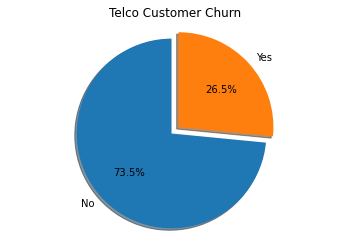

In [11]:
labels = df_1.index
sizes = [df_1_pct[0], df_1_pct[1]]
explode = (0, 0.1)  # only "explode" the 2nd slice 

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Telco Customer Churn')
plt.show()

## 2.	Berdasarkan jenis kelamin, pelanggan manakah yang cenderung akan churn? Silahkan berikan alasannya 

In [12]:
def bar_chart(feat):
    churn = df_raw[df_raw['Churn'] == 'Yes'][feat].value_counts()
    stay = df_raw[df_raw['Churn'] == 'No'][feat].value_counts()
    df = pd.DataFrame([churn, stay])
    df.index = ['Yes', 'No']
    df.plot(kind='bar', stacked= True, figsize = (10, 5))

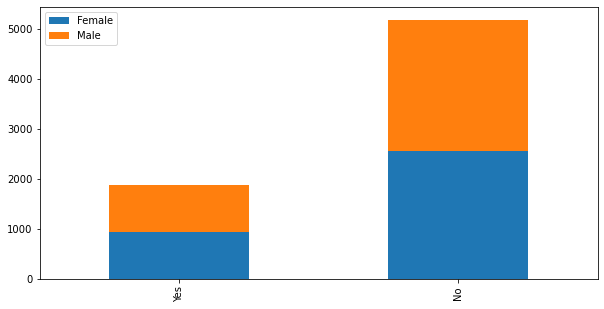

In [13]:
bar_chart('gender')

In [14]:
df_raw.groupby(['Churn', 'gender'])['customerID'].count()

Churn  gender
No     Female    2549
       Male      2625
Yes    Female     939
       Male       930
Name: customerID, dtype: int64

## 3.	Berdasarkan jenis kewarganegaraannya, pelanggan manakah yang cenderung akan churn? Silahkan berikan alasannya

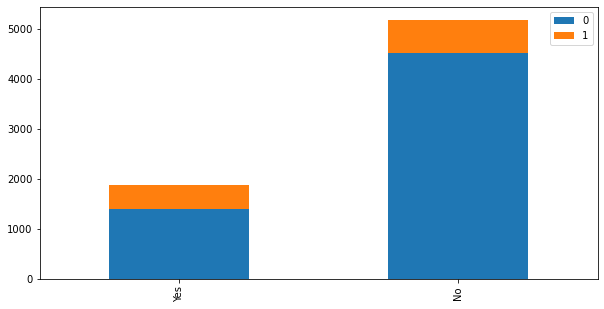

In [15]:
bar_chart('SeniorCitizen')

In [16]:
df_raw.groupby(['Churn', 'SeniorCitizen'])['customerID'].count()

Churn  SeniorCitizen
No     0                4508
       1                 666
Yes    0                1393
       1                 476
Name: customerID, dtype: int64

## 4.	Berdasarkan layanan internet, pelanggan manakah yang cenderung akan churn? Silahkan berikan alasannya

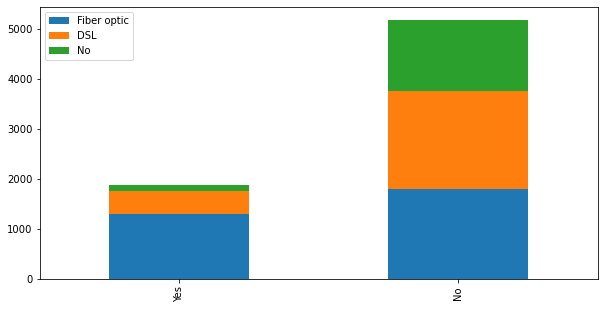

In [17]:
bar_chart('InternetService')

In [18]:
df_raw.groupby(['Churn', 'InternetService'])['customerID'].count()

Churn  InternetService
No     DSL                1962
       Fiber optic        1799
       No                 1413
Yes    DSL                 459
       Fiber optic        1297
       No                  113
Name: customerID, dtype: int64

## 5.	Berdasarkan jenis kontraknya, pelanggan manakah yang cenderung akan churn? Silahkan berikan alasannya

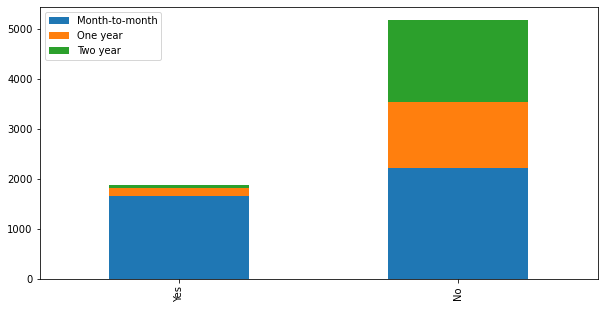

In [19]:
bar_chart('Contract')

In [20]:
df_raw.groupby(['Churn', 'Contract'])['customerID'].count()

Churn  Contract      
No     Month-to-month    2220
       One year          1307
       Two year          1647
Yes    Month-to-month    1655
       One year           166
       Two year            48
Name: customerID, dtype: int64

## 6.	Berdasarkan biaya bulanan, pelanggan manakah yang cenderung akan churn? Silahkan berikan alasannya

In [21]:
pd.set_option('max_rows', 10000)

In [22]:
ct_monthlyCharge = pd.DataFrame(df_raw.groupby('MonthlyCharges')['customerID'].count())
ct_monthlyCharge.rename(columns = {'customerID':'count'}, inplace = True)
ct_monthlyCharge.sort_values(by = ['count'], ascending=False)

,count
MonthlyCharges,
20.05,61
19.85,45
19.95,44
19.90,44
19.70,43
19.65,43
20.00,43
19.55,40
20.15,40


In [23]:
ct_monthlyCharge.count()

count    1585
dtype: int64

In [24]:
ct_monthlyCharge.sort_values(by = ['MonthlyCharges'], ascending=True)

,count
MonthlyCharges,
18.25,1
18.40,1
18.55,1
18.70,2
18.75,1
18.80,7
18.85,5
18.90,2
18.95,6


<AxesSubplot:xlabel='MonthlyCharges'>

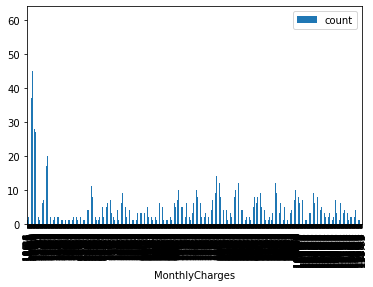

In [25]:
ct_monthlyCharge.plot(kind = 'bar')

In [26]:
aa = pd.DataFrame(df_raw.MonthlyCharges.astype(float))

In [27]:
aa.describe()

,MonthlyCharges
count,7043.000000
mean,64.761692
std,30.090047
min,18.250000
25%,35.500000
50%,70.350000
75%,89.850000
max,118.750000


In [28]:
def bin_mthcharge(data):
    if data >= 89.85:
        result = 4
    elif data >= 70.35:
        result = 3
    elif data >= 35.5:
        result = 2
    elif data >= 18.25:
        result = 1
    else:
        result = 0
    return result    

In [29]:
df_raw['MonthlyCharges2'] = df_raw['MonthlyCharges'].apply(lambda x: bin_mthcharge(x))

In [30]:
df_raw.groupby('MonthlyCharges2')['customerID'].count()

MonthlyCharges2
1    1759
2    1760
3    1753
4    1771
Name: customerID, dtype: int64

In [31]:
1759+1760+1753+1771

7043

In [32]:
df_raw

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,MonthlyCharges2
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,1
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No,2
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,2
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No,2
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,3
5,9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,4
6,1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.4,No,3
7,6713-OKOMC,Female,0,No,No,10,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.9,No,1
8,7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,4
9,6388-TABGU,Male,0,No,Yes,62,Yes,No,DSL,Yes,Yes,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No,2


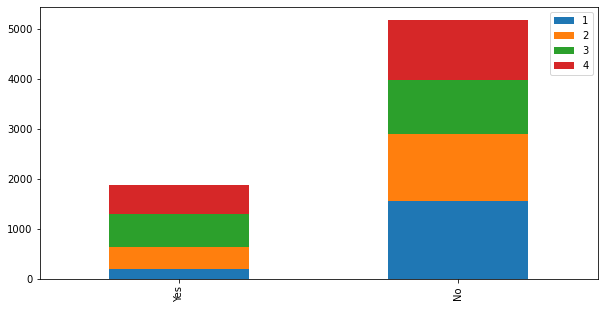

In [33]:
bar_chart('MonthlyCharges2')

In [34]:
df_raw.groupby(['Churn', 'MonthlyCharges2'])['customerID'].count()

Churn  MonthlyCharges2
No     1                  1561
       2                  1327
       3                  1095
       4                  1191
Yes    1                   198
       2                   433
       3                   658
       4                   580
Name: customerID, dtype: int64

In [35]:
churn_yes = df_raw[df_raw['Churn'] == 'Yes']['MonthlyCharges']
churn_no = df_raw[df_raw['Churn'] == 'No']['MonthlyCharges']

In [36]:
df_box = pd.DataFrame([churn_yes, churn_no], columns = ['yes', 'no'])

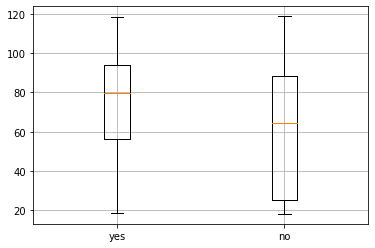

In [37]:
plt.boxplot([churn_yes, churn_no])
plt.grid()
plt.xticks([1, 2], ['yes', 'no'])
plt.show()

In [38]:
print('-- churn yes --')
print('q1: ', churn_yes.quantile(0.25))
print('q2: ', churn_yes.quantile(0.5))
print('q3: ', churn_yes.quantile(0.75))
print('sd: ', round(churn_yes.std(), 2))
print("")
print('-- churn no --')
print('q1: ', churn_no.quantile(0.25))
print('q2: ', round(churn_no.quantile(0.5), 2))
print('q3: ', churn_no.quantile(0.75))
print('sd: ', round(churn_no.std(), 2))

-- churn yes --
q1:  56.15
q2:  79.65
q3:  94.2
sd:  24.67

-- churn no --
q1:  25.1
q2:  64.43
q3:  88.4
sd:  31.09


## 7.	Metode apakah yang anda gunakan untuk mengubah data categorical menjadi numerical? 


In [39]:
df_raw2 = pd.read_csv('telco_customer_churn_num.csv', sep = ';')

In [40]:
print(df_raw2.shape)
df_raw2.head()

(7043, 21)


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [41]:
df_raw2.isnull().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

In [42]:
df_input = df_raw2[df_raw2.TotalCharges.isnull() == False].copy()

print(df_input.shape)
df_input.head()

(7032, 21)


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [43]:
df_input.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [44]:
my_var = 'TotalCharges'

df_raw.groupby(my_var)['customerID'].count()

TotalCharges
           11
100.2       1
100.25      1
100.35      1
100.4       1
100.8       1
100.9       1
1001.2      1
1001.5      1
1003.05     1
1004.35     1
1004.5      1
1004.75     1
1005.7      1
1006.9      1
1007.8      1
1007.9      1
1008.55     1
1008.7      2
1009.25     1
101.1       1
101.45      1
101.65      1
101.9       1
1010        1
1011.05     1
1011.5      1
1011.8      1
1012.4      1
1013.05     1
1013.2      1
1013.35     1
1013.6      1
1014.25     1
1016.7      1
1017.35     1
102.45      1
102.5       1
102.75      1
1020.2      1
1020.75     1
1021.55     1
1021.75     1
1021.8      1
1022.5      1
1022.6      1
1022.95     1
1023.75     1
1023.85     1
1023.9      1
1023.95     1
1024        1
1024.65     1
1024.7      1
1025.05     1
1025.15     2
1025.95     1
1026.35     1
1027.25     1
1028.75     1
1028.9      1
1029.35     1
1029.75     1
1029.8      1
103.7       1
1031.1      1
1031.4      1
1031.7      1
1032        1
1032.05     1
1033   

In [45]:
def bin_churn(data):
    if data == "Yes":
        result = 1
    else:
        result = 0
    return result     

def bin_gender(data):
    if data == "Male":
        result = 1 
    else:
        result = 0
    return result    


In [46]:
# binner: Churn, gender, SeniorCitizen, Partner, Dependents, PhoneService, PaperlessBilling
# onehot: MultipleLines, InternetService, OnlineSecurity, OnlineBackup, DeviceProtection, TechSupport, StreamingTV, StreamingMovies, Contract, PaymentMethod
# cont: tenure , MonthlyCharges, TotalCharges, 

In [47]:
df_input['Churn2'] = df_input['Churn'].apply(lambda x: bin_churn(x))
df_input['gender2'] = df_input['gender'].apply(lambda x: bin_gender(x))
df_input['Partner2'] = df_input['Partner'].apply(lambda x: bin_churn(x))
df_input['Dependents2'] = df_input['Dependents'].apply(lambda x: bin_churn(x))
df_input['PhoneService2'] = df_input['PhoneService'].apply(lambda x: bin_churn(x))
df_input['PaperlessBilling2'] = df_input['PaperlessBilling'].apply(lambda x: bin_churn(x))

In [48]:
df_input.groupby(['Churn', 'Churn2'])['customerID'].count()

Churn  Churn2
No     0         5163
Yes    1         1869
Name: customerID, dtype: int64

In [49]:
MultipleLines = df_input.MultipleLines.str.get_dummies()
InternetService = df_input.InternetService.str.get_dummies()
OnlineSecurity = df_input.OnlineSecurity.str.get_dummies()
OnlineBackup = df_input.OnlineBackup.str.get_dummies()
DeviceProtection = df_input.DeviceProtection.str.get_dummies()
TechSupport = df_input.TechSupport.str.get_dummies()
StreamingTV = df_input.StreamingTV.str.get_dummies()
StreamingMovies = df_input.StreamingMovies.str.get_dummies()
Contract = df_input.Contract.str.get_dummies()
PaymentMethod = df_input.PaymentMethod.str.get_dummies()

In [50]:
MultipleLines.rename(columns={'Yes':'MultipleLines_yes', 'No':'MultipleLines_no', 'No phone service':'MultipleLines_no_ph_svc'}, inplace = True)
InternetService.rename(columns = {'DSL':'inetsvc_dsl', 'Fiber optic':'inet_fiber', 'No':'inet_no'}, inplace= True)
OnlineSecurity.rename(columns = {'No':'olsecurity_no','No internet service': 'olsecurity_noinet', 'Yes':'olsecurity_yes'}, inplace = True)
OnlineBackup.rename(columns = {'No':'olbackup_no','No internet service': 'olbackup_noinet', 'Yes':'olbackup_yes'}, inplace = True)
DeviceProtection.rename(columns = {'No':'devprotect_no','No internet service': 'devprotect_noinet', 'Yes':'devprotect_yes'}, inplace = True)
TechSupport.rename(columns = {'No':'techsupport_no','No internet service': 'techsupport_noinet', 'Yes':'techsupport_yes'}, inplace = True)
StreamingTV.rename(columns = {'No':'streamtv_no','No internet service': 'streamtv_noinet', 'Yes':'streamtv_yes'}, inplace = True)
StreamingMovies.rename(columns = {'No':'streammov_no','No internet service': 'streammov_noinet', 'Yes':'streammov_yes'}, inplace = True)
Contract.rename(columns = {'Month-to-month':'contract_m2m', 'One year':'contract_1y', 'Two year':'contract_2y'}, inplace = True)
PaymentMethod.rename(columns = {'Bank transfer (automatic)':'pymt_banktf', 'Credit card (automatic)':'pymt_cc', 'Electronic check':'pymt_echeck', 'Mailed check':'pymt_mailedcheck'},
                    inplace = True)

In [51]:
df_input = pd.concat([df_input, MultipleLines, InternetService, OnlineSecurity, OnlineBackup, DeviceProtection, TechSupport, StreamingTV, StreamingMovies, Contract, PaymentMethod], 
                     axis = 1)

In [52]:
df_input.shape

(7032, 58)

## 8.	Metode apakah yang akan anda gunakan untuk menangani persoalan pada nomor 1? Mengapa anda menggunakan metode tersebut

Klasifikasi dengan algoritme Regresi Logistik dan XGBoost Classification

## 9.	Buatlah machine learning model untuk memprediksi pelanggan yang akan churn dibulan berikutnya dan tunjukan hasil evaluasi model tersebut

In [53]:
df_input.isnull().sum()

customerID                 0
gender                     0
SeniorCitizen              0
Partner                    0
Dependents                 0
tenure                     0
PhoneService               0
MultipleLines              0
InternetService            0
OnlineSecurity             0
OnlineBackup               0
DeviceProtection           0
TechSupport                0
StreamingTV                0
StreamingMovies            0
Contract                   0
PaperlessBilling           0
PaymentMethod              0
MonthlyCharges             0
TotalCharges               0
Churn                      0
Churn2                     0
gender2                    0
Partner2                   0
Dependents2                0
PhoneService2              0
PaperlessBilling2          0
MultipleLines_no           0
MultipleLines_no_ph_svc    0
MultipleLines_yes          0
inetsvc_dsl                0
inet_fiber                 0
inet_no                    0
olsecurity_no              0
olsecurity_noi

In [54]:
df_input.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 58 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   customerID               7032 non-null   object 
 1   gender                   7032 non-null   object 
 2   SeniorCitizen            7032 non-null   int64  
 3   Partner                  7032 non-null   object 
 4   Dependents               7032 non-null   object 
 5   tenure                   7032 non-null   int64  
 6   PhoneService             7032 non-null   object 
 7   MultipleLines            7032 non-null   object 
 8   InternetService          7032 non-null   object 
 9   OnlineSecurity           7032 non-null   object 
 10  OnlineBackup             7032 non-null   object 
 11  DeviceProtection         7032 non-null   object 
 12  TechSupport              7032 non-null   object 
 13  StreamingTV              7032 non-null   object 
 14  StreamingMovies         

In [55]:
print(df_raw.shape)
print(df_raw2.shape)
print(df_input.shape)

(7043, 22)
(7043, 21)
(7032, 58)


In [56]:
df_input.columns
# binner: Churn, gender, SeniorCitizen, Partner, Dependents, PhoneService, PaperlessBilling
# dummy: MultipleLines, InternetService, OnlineSecurity, OnlineBackup, DeviceProtection, TechSupport, StreamingTV, StreamingMovies, Contract, PaymentMethod
# cont: tenure , MonthlyCharges, TotalCharges, 

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn', 'Churn2',
       'gender2', 'Partner2', 'Dependents2', 'PhoneService2',
       'PaperlessBilling2', 'MultipleLines_no', 'MultipleLines_no_ph_svc',
       'MultipleLines_yes', 'inetsvc_dsl', 'inet_fiber', 'inet_no',
       'olsecurity_no', 'olsecurity_noinet', 'olsecurity_yes', 'olbackup_no',
       'olbackup_noinet', 'olbackup_yes', 'devprotect_no', 'devprotect_noinet',
       'devprotect_yes', 'techsupport_no', 'techsupport_noinet',
       'techsupport_yes', 'streamtv_no', 'streamtv_noinet', 'streamtv_yes',
       'streammov_no', 'streammov_noinet', 'streammov_yes', 'contract_m2m',
       'contract_1y', 'contract_2y', 'pymt_banktf', 

In [57]:
df_input_mdl = df_input[['Churn2',
                        'tenure' , 'MonthlyCharges', 'TotalCharges',  
                        'gender2','SeniorCitizen','Partner2','Dependents2','PhoneService2','PaperlessBilling2',
                        'MultipleLines_no', 'MultipleLines_no_ph_svc',
                        'MultipleLines_yes', 'inetsvc_dsl', 'inet_fiber', 'inet_no',
                        'olsecurity_no', 'olsecurity_noinet', 'olsecurity_yes', 'olbackup_no',
                        'olbackup_noinet', 'olbackup_yes', 'devprotect_no', 'devprotect_noinet',
                        'devprotect_yes', 'techsupport_no', 'techsupport_noinet',
                        'techsupport_yes', 'streamtv_no', 'streamtv_noinet', 'streamtv_yes',
                        'streammov_no', 'streammov_noinet', 'streammov_yes', 'contract_m2m',
                        'contract_1y', 'contract_2y', 'pymt_banktf', 'pymt_cc', 'pymt_echeck',
                        'pymt_mailedcheck' 
                        ]].copy()

In [58]:
X = df_input_mdl.drop(['Churn2'], axis = 1)
y = df_input_mdl.Churn2


print("panjang X "+str(len(X))+" panjang y "+ str(len(y)))

panjang X 7032 panjang y 7032


In [59]:
df_input_mdl.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 41 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn2                   7032 non-null   int64  
 1   tenure                   7032 non-null   int64  
 2   MonthlyCharges           7032 non-null   float64
 3   TotalCharges             7032 non-null   float64
 4   gender2                  7032 non-null   int64  
 5   SeniorCitizen            7032 non-null   int64  
 6   Partner2                 7032 non-null   int64  
 7   Dependents2              7032 non-null   int64  
 8   PhoneService2            7032 non-null   int64  
 9   PaperlessBilling2        7032 non-null   int64  
 10  MultipleLines_no         7032 non-null   int64  
 11  MultipleLines_no_ph_svc  7032 non-null   int64  
 12  MultipleLines_yes        7032 non-null   int64  
 13  inetsvc_dsl              7032 non-null   int64  
 14  inet_fiber              

In [ ]:
from collections import Counter

Class=0, n=5163 (73.422%)
Class=1, n=1869 (26.578%)


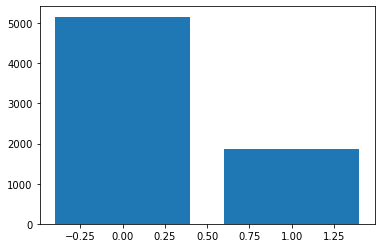

In [61]:
# summarize distribution

counter = Counter(y)
for k,v in counter.items():
	per = v / len(y) * 100
	print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
plt.bar(counter.keys(), counter.values())
plt.show()

## SMOTE

In [62]:
from sklearn.model_selection import train_test_split

In [63]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=3, stratify=y)

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((5625, 40), (5625,), (1407, 40), (1407,))

In [64]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5625 entries, 4456 to 676
Data columns (total 40 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   tenure                   5625 non-null   int64  
 1   MonthlyCharges           5625 non-null   float64
 2   TotalCharges             5625 non-null   float64
 3   gender2                  5625 non-null   int64  
 4   SeniorCitizen            5625 non-null   int64  
 5   Partner2                 5625 non-null   int64  
 6   Dependents2              5625 non-null   int64  
 7   PhoneService2            5625 non-null   int64  
 8   PaperlessBilling2        5625 non-null   int64  
 9   MultipleLines_no         5625 non-null   int64  
 10  MultipleLines_no_ph_svc  5625 non-null   int64  
 11  MultipleLines_yes        5625 non-null   int64  
 12  inetsvc_dsl              5625 non-null   int64  
 13  inet_fiber               5625 non-null   int64  
 14  inet_no               

In [60]:
from imblearn.over_sampling import SMOTE

In [65]:
print(Counter(y_train))

sm = SMOTE(random_state = 7) #, sampling_strategy = "auto"), means resample all but the majority
x_res, y_res = sm.fit_resample(X_train, y_train)

Counter({0: 4130, 1: 1495})


In [66]:
print(len(x_res), " ", len(y_res))

8260   8260


In [67]:
from sklearn.linear_model import LogisticRegression

In [68]:
lr = LogisticRegression(solver='liblinear', penalty = 'l1') 

In [70]:
train_model = lr.fit(x_res, y_res)
importance = train_model.coef_[0]

In [72]:
fi = pd.DataFrame(importance, columns = ['importance'])
col_names = pd.DataFrame(X_train.columns.values.tolist(), columns = ['feature'])
fi_rl = pd.concat([col_names, fi], axis = 1)
fi_rl.shape

(40, 2)

In [73]:
fi_rl.sort_values(by = ['importance'], ascending=False)

,feature,importance
12,inetsvc_dsl,1.609095
7,PhoneService2,0.773759
8,PaperlessBilling2,0.304837
10,MultipleLines_no_ph_svc,0.120437
1,MonthlyCharges,0.096745
4,SeniorCitizen,0.072317
2,TotalCharges,0.000599
13,inet_fiber,-0.081493
0,tenure,-0.084504
5,Partner2,-0.101671


In [74]:
pred_y_test = train_model.predict(X_test)
pred_y_train = train_model.predict(X_train)

In [75]:
from sklearn.metrics import accuracy_score

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

In [76]:
#  evaluate predictions
accuracy = accuracy_score(y_train, pred_y_train)
print('training report')
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("")
print(classification_report(y_train, pred_y_train))

training report
Accuracy: 80.36%

              precision    recall  f1-score   support

           0       0.87      0.87      0.87      4130
           1       0.63      0.63      0.63      1495

    accuracy                           0.80      5625
   macro avg       0.75      0.75      0.75      5625
weighted avg       0.80      0.80      0.80      5625



In [77]:
#Test Confusion Matrix
print("Train")
print(confusion_matrix(y_train, pred_y_train))

print("Test/Validation")
print(confusion_matrix(y_test, pred_y_test))

print(classification_report(y_test, pred_y_test))

Train
[[3582  548]
 [ 557  938]]
Test/Validation
[[870 163]
 [145 229]]
              precision    recall  f1-score   support

           0       0.86      0.84      0.85      1033
           1       0.58      0.61      0.60       374

    accuracy                           0.78      1407
   macro avg       0.72      0.73      0.72      1407
weighted avg       0.78      0.78      0.78      1407



In [85]:
import seaborn as sns

Text(33.0, 0.5, 'True Label')

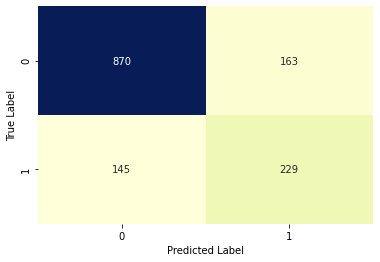

In [86]:
conf_mat = confusion_matrix(y_test, pred_y_test) 
sns.heatmap(conf_mat, square=False, annot=True, fmt='d', cbar=False,cmap="YlGnBu")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

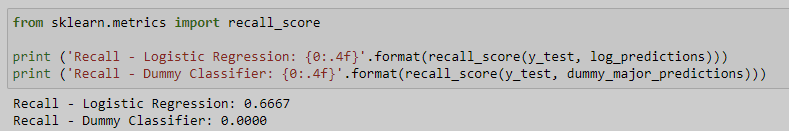

In [94]:
from sklearn.metrics import recall_score, precision_score, accuracy_score

In [95]:
print('Accuracy - Logistic Regression: {0:.4f}'.format(accuracy_score(y_test, pred_y_test)))
print('Recall - Logistic Regression: {0:.4f}'.format(recall_score(y_test, pred_y_test)))
print('Precision - Logistic Regression: {0:.4f}'.format(precision_score(y_test, pred_y_test)))

Accuracy - Logistic Regression: 0.7811
Recall - Logistic Regression: 0.6123
Precision - Logistic Regression: 0.5842


In [79]:
import pickle

In [83]:
with open('./model/logreg_smote', 'wb') as handle:
    pickle.dump(train_model, handle, protocol = pickle.HIGHEST_PROTOCOL)
    
# with open('D:/SMOTE', 'wb') as handle: #save to pickle
#     pickle.dump(train_model1, handle, protocol=pickle.HIGHEST_PROTOCOL)

## Bootstrap

### Create input for bootstrap

In [96]:
df_input.shape

(7032, 58)

In [99]:
df_churn_1 = df_input_mdl[df_input_mdl['Churn2'] == 1]
df_churn_0 = df_input_mdl[df_input_mdl['Churn2'] == 0]

In [100]:
print(df_churn_0.shape)
print(df_churn_1.shape)

(5163, 41)
(1869, 41)


In [102]:
df_churn_1.to_csv('./data/bootstrap_df_input_1.csv', index = False)
df_churn_0.to_csv('./data/bootstrap_df_input_0.csv', index = False)

### Read the data after bootstrap

In [104]:
boost_0 = pd.read_csv('./data/boost_0.csv')
boost_1 = pd.read_csv('./data/boost_1.csv')

In [105]:
print("boost_0:", boost_0.shape)
print("boost_1:", boost_1.shape)

boost_0: (62855, 41)
boost_1: (59999, 41)


In [107]:
boost_0.groupby('Churn2')['Churn2'].count()

Churn2
0         54999
Churn2     7856
Name: Churn2, dtype: int64

In [108]:
df_boost_0 = boost_0[boost_0['Churn2']!="Churn2"].copy()
df_boost_1 = boost_1[boost_1['Churn2']!="Churn2"].copy()

In [109]:
print("df_boost_0:", df_boost_0.shape)
print("df_boost_1:", df_boost_1.shape)

df_boost_0: (54999, 41)
df_boost_1: (45000, 41)


In [120]:
df_boots_raw = pd.concat([df_boost_1, df_boost_0], axis = 0)
print(df_boots_raw.shape)

(99999, 41)


In [121]:
df_boots_raw.head()

,Churn2,tenure,MonthlyCharges,TotalCharges,gender2,SeniorCitizen,Partner2,Dependents2,PhoneService2,PaperlessBilling2,MultipleLines_no,MultipleLines_no_ph_svc,MultipleLines_yes,inetsvc_dsl,inet_fiber,inet_no,olsecurity_no,olsecurity_noinet,olsecurity_yes,olbackup_no,olbackup_noinet,olbackup_yes,devprotect_no,devprotect_noinet,devprotect_yes,techsupport_no,techsupport_noinet,techsupport_yes,streamtv_no,streamtv_noinet,streamtv_yes,streammov_no,streammov_noinet,streammov_yes,contract_m2m,contract_1y,contract_2y,pymt_banktf,pymt_cc,pymt_echeck,pymt_mailedcheck
0,1,4,73.9,280.85,1,0,0,0,1,1,1,0,0,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
1,1,3,75.05,256.25,0,1,0,0,1,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0
2,1,1,80.2,80.2,0,0,0,0,1,1,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1
4,1,11,102,1145.35,0,0,1,0,1,1,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0
5,1,28,90.1,2598.95,0,0,1,1,1,1,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0


In [122]:
df_boots_raw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99999 entries, 0 to 62854
Data columns (total 41 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Churn2                   99999 non-null  object
 1   tenure                   99999 non-null  object
 2   MonthlyCharges           99999 non-null  object
 3   TotalCharges             99999 non-null  object
 4   gender2                  99999 non-null  object
 5   SeniorCitizen            99999 non-null  object
 6   Partner2                 99999 non-null  object
 7   Dependents2              99999 non-null  object
 8   PhoneService2            99999 non-null  object
 9   PaperlessBilling2        99999 non-null  object
 10  MultipleLines_no         99999 non-null  object
 11  MultipleLines_no_ph_svc  99999 non-null  object
 12  MultipleLines_yes        99999 non-null  object
 13  inetsvc_dsl              99999 non-null  object
 14  inet_fiber               99999 non-nul

In [123]:
df_boots_raw.to_csv('./data/bootstrap_inputmdl.csv', index = False)

In [124]:
df_boots = pd.read_csv('./data/bootstrap_inputmdl.csv')

In [125]:
print(df_boots.shape)
df_boots.head()

(99999, 41)


,Churn2,tenure,MonthlyCharges,TotalCharges,gender2,SeniorCitizen,Partner2,Dependents2,PhoneService2,PaperlessBilling2,MultipleLines_no,MultipleLines_no_ph_svc,MultipleLines_yes,inetsvc_dsl,inet_fiber,inet_no,olsecurity_no,olsecurity_noinet,olsecurity_yes,olbackup_no,olbackup_noinet,olbackup_yes,devprotect_no,devprotect_noinet,devprotect_yes,techsupport_no,techsupport_noinet,techsupport_yes,streamtv_no,streamtv_noinet,streamtv_yes,streammov_no,streammov_noinet,streammov_yes,contract_m2m,contract_1y,contract_2y,pymt_banktf,pymt_cc,pymt_echeck,pymt_mailedcheck
0,1,4,73.90,280.85,1,0,0,0,1,1,1,0,0,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0
1,1,3,75.05,256.25,0,1,0,0,1,1,0,0,1,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0
2,1,1,80.20,80.20,0,0,0,0,1,1,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1
3,1,11,102.00,1145.35,0,0,1,0,1,1,0,0,1,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0
4,1,28,90.10,2598.95,0,0,1,1,1,1,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0


In [126]:
df_boots.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 41 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Churn2                   99999 non-null  int64  
 1   tenure                   99999 non-null  int64  
 2   MonthlyCharges           99999 non-null  float64
 3   TotalCharges             99999 non-null  float64
 4   gender2                  99999 non-null  int64  
 5   SeniorCitizen            99999 non-null  int64  
 6   Partner2                 99999 non-null  int64  
 7   Dependents2              99999 non-null  int64  
 8   PhoneService2            99999 non-null  int64  
 9   PaperlessBilling2        99999 non-null  int64  
 10  MultipleLines_no         99999 non-null  int64  
 11  MultipleLines_no_ph_svc  99999 non-null  int64  
 12  MultipleLines_yes        99999 non-null  int64  
 13  inetsvc_dsl              99999 non-null  int64  
 14  inet_fiber            

In [135]:
x_boots = df_boots.drop(['Churn2'], axis = 1)
y_boots = df_boots.Churn2.copy()

In [136]:
print("panjang X "+str(len(x_boots))+" panjang y "+ str(len(y_boots)))

panjang X 99999 panjang y 99999


Class=1, n=45000 (45.000%)
Class=0, n=54999 (55.000%)


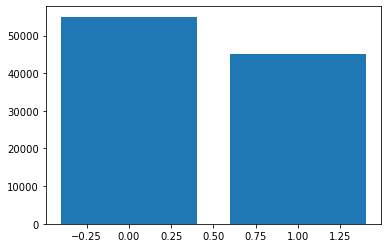

In [137]:
# summarize distribution

counter = Counter(y_boots)
for k,v in counter.items():
	per = v / len(y_boots) * 100
	print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
plt.bar(counter.keys(), counter.values())
plt.show()

### Logistic Regression 

In [157]:
lr = LogisticRegression(solver='liblinear', penalty = 'l1') 
# lr = LogisticRegression(solver='liblinear', penalty = 'l2') 

In [158]:
X_train, X_test, y_train, y_test = train_test_split(x_boots, y_boots, test_size = 0.2, random_state=3, stratify=y_boots)

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((79999, 40), (79999,), (20000, 40), (20000,))

In [159]:
train_model = lr.fit(X_train, y_train)
importance = train_model.coef_[0]

In [160]:
fi = pd.DataFrame(importance, columns = ['importance'])
col_names = pd.DataFrame(X_train.columns.values.tolist(), columns = ['feature'])
fi_rl = pd.concat([col_names, fi], axis = 1)
fi_rl.shape

(40, 2)

In [161]:
fi_rl.sort_values(by = ['importance'], ascending=False)

,feature,importance
15,olsecurity_no,0.647684
10,MultipleLines_no_ph_svc,0.361730
8,PaperlessBilling2,0.323032
29,streamtv_yes,0.309689
17,olsecurity_yes,0.299517
4,SeniorCitizen,0.231704
33,contract_m2m,0.231124
13,inet_fiber,0.229518
24,techsupport_no,0.215280
32,streammov_yes,0.201389


In [162]:
pred_y_test = train_model.predict(X_test)
pred_y_train = train_model.predict(X_train)

In [163]:
#  evaluate predictions
accuracy = accuracy_score(y_train, pred_y_train)
print('training report')
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("")
print(classification_report(y_train, pred_y_train))

training report
Accuracy: 76.56%

              precision    recall  f1-score   support

           0       0.80      0.76      0.78     43999
           1       0.73      0.77      0.75     36000

    accuracy                           0.77     79999
   macro avg       0.76      0.77      0.76     79999
weighted avg       0.77      0.77      0.77     79999



In [164]:
#Test Confusion Matrix
print("Train")
print(confusion_matrix(y_train, pred_y_train))

print("Test/Validation")
print(confusion_matrix(y_test, pred_y_test))

print(classification_report(y_test, pred_y_test))

Train
[[33606 10393]
 [ 8361 27639]]
Test/Validation
[[8383 2617]
 [1996 7004]]
              precision    recall  f1-score   support

           0       0.81      0.76      0.78     11000
           1       0.73      0.78      0.75      9000

    accuracy                           0.77     20000
   macro avg       0.77      0.77      0.77     20000
weighted avg       0.77      0.77      0.77     20000



Text(33.0, 0.5, 'True Label')

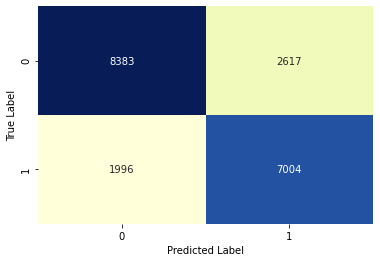

In [165]:
conf_mat = confusion_matrix(y_test, pred_y_test) 
sns.heatmap(conf_mat, square=False, annot=True, fmt='d', cbar=False,cmap="YlGnBu")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

In [166]:
print('Accuracy - Logistic Regression: {0:.4f}'.format(accuracy_score(y_test, pred_y_test)))
print('Recall - Logistic Regression: {0:.4f}'.format(recall_score(y_test, pred_y_test)))
print('Precision - Logistic Regression: {0:.4f}'.format(precision_score(y_test, pred_y_test)))

Accuracy - Logistic Regression: 0.7693
Recall - Logistic Regression: 0.7782
Precision - Logistic Regression: 0.7280


In [167]:
with open('logreg_bootstrap', 'wb') as handle:
    pickle.dump(train_model, handle, protocol = pickle.HIGHEST_PROTOCOL)
    

### XGB Classifier

In [168]:
import xgboost as xgb

In [205]:
# Run the Model Using XGBoost
# from sklearn.metrics import accuracy_score

# model1= xgb.XGBClassifier() # 95.38%
# model1= xgb.XGBClassifier(n_estimators=250, max_depth=10, learning_rate=0.07, subsample=0.8, seed=5) # 99.30% NOPE
# model1= xgb.XGBClassifier(n_estimators=250, max_depth=10, learning_rate=0.02, subsample=0.8, seed=5) #  96.52%
model1= xgb.XGBClassifier(n_estimators=250, max_depth=10, learning_rate=0.02, subsample=0.7, seed=5) #  96.52%
# model1= xgb.XGBClassifier(n_estimators=250, max_depth=10, learning_rate=0.04, subsample=0.8, seed=5) # 98.19% NOPE
# model1= xgb.XGBClassifier(n_estimators=200, max_depth=5,  learning_rate=0.08, subsample=0.75, seed=5) # 86.48%
# model1= xgb.XGBClassifier(n_estimators=200, max_depth=10, learning_rate=0.07, subsample=0.75, seed=5) # 99.03%
# model1= xgb.XGBClassifier(n_estimators=200, max_depth=10, learning_rate=0.03, subsample=0.8, seed=5) # 96.94% NOPE

# model1= xgb.XGBClassifier(n_estimators=200, max_depth=5,  learning_rate=0.01, subsample=0.75, seed=5) # 79.41% NOPE
# model1= xgb.XGBClassifier(n_estimators=300, max_depth=5,  learning_rate=0.01, subsample=0.75, seed=5) # 80.09% NOPE
# model1= xgb.XGBClassifier(n_estimators=250, max_depth=5,  learning_rate=0.01, subsample=0.75, seed=5) #  79.67% NOPE
# model1= xgb.XGBClassifier(n_estimators=150, max_depth=5,  learning_rate=0.01, subsample=0.75, seed=5) # 79.05% NOPE
# model1= xgb.XGBClassifier(n_estimators=175, max_depth=5,  learning_rate=0.01, subsample=0.75, seed=5) # 79.12%
# model1= xgb.XGBClassifier(n_estimators=185, max_depth=5,  learning_rate=0.01, subsample=0.75, seed=5) # 79.21% NOPE

#for not treatment data, use this code
#train_model1 = model1.fit(X_train, y_train)

#for oversampling data use this code:
train_model1 = model1.fit(X_train, y_train) # for less20m oversampling

print(train_model1)
# make predictions for test data
y_pred = train_model1.predict(X_test)
predictions = [round(value) for value in y_pred]

# evaluate predictions
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

C:\ProgramData\Anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:23:30] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.02, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=250, n_jobs=16, num_parallel_tree=1, random_state=5,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=5,
              subsample=0.7, tree_method='exact', validate_parameters=1,
              verbosity=None)
Accuracy: 96.56%


In [206]:
#Test Confusion Matrix
print("Train")
print(confusion_matrix(y_train, train_model1.predict(X_train), labels=[0, 1]))

from sklearn.metrics import confusion_matrix
print("Test/Validation")
print(confusion_matrix(y_test, predictions, labels=[0, 1]))

from sklearn.metrics import classification_report
print(classification_report(y_test, predictions, labels=[0, 1]))

Train
[[41754  2245]
 [  130 35870]]
Test/Validation
[[10370   630]
 [   57  8943]]
              precision    recall  f1-score   support

           0       0.99      0.94      0.97     11000
           1       0.93      0.99      0.96      9000

    accuracy                           0.97     20000
   macro avg       0.96      0.97      0.97     20000
weighted avg       0.97      0.97      0.97     20000



In [207]:
pred_y_test = train_model1.predict(X_test)
pred_y_train = train_model1.predict(X_train)

In [208]:
#  evaluate predictions
accuracy = accuracy_score(y_train, pred_y_train)
print('training report')
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print("")
print(classification_report(y_train, pred_y_train))

training report
Accuracy: 97.03%

              precision    recall  f1-score   support

           0       1.00      0.95      0.97     43999
           1       0.94      1.00      0.97     36000

    accuracy                           0.97     79999
   macro avg       0.97      0.97      0.97     79999
weighted avg       0.97      0.97      0.97     79999



In [209]:
#Test Confusion Matrix
print("Train")
print(confusion_matrix(y_train, pred_y_train))

print("Test/Validation")
print(confusion_matrix(y_test, pred_y_test))

print(classification_report(y_test, pred_y_test))

Train
[[41754  2245]
 [  130 35870]]
Test/Validation
[[10370   630]
 [   57  8943]]
              precision    recall  f1-score   support

           0       0.99      0.94      0.97     11000
           1       0.93      0.99      0.96      9000

    accuracy                           0.97     20000
   macro avg       0.96      0.97      0.97     20000
weighted avg       0.97      0.97      0.97     20000



Text(33.0, 0.5, 'True Label')

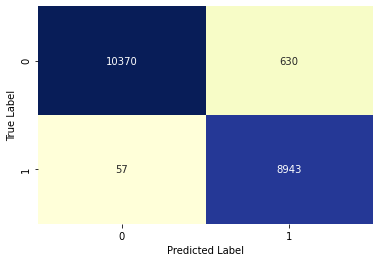

In [210]:
conf_mat = confusion_matrix(y_test, pred_y_test) 
sns.heatmap(conf_mat, square=False, annot=True, fmt='d', cbar=False,cmap="YlGnBu")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

In [211]:
print('Accuracy - XGB Classification: {0:.4f}'.format(accuracy_score(y_test, pred_y_test)))
print('Recall - XGB Classification: {0:.4f}'.format(recall_score(y_test, pred_y_test)))
print('Precision - XGB Classification: {0:.4f}'.format(precision_score(y_test, pred_y_test)))

Accuracy - XGB Classification: 0.9657
Recall - XGB Classification: 0.9937
Precision - XGB Classification: 0.9342


In [212]:
with open('./model/logreg_bootstrap', 'wb') as handle:
    pickle.dump(train_model1, handle, protocol = pickle.HIGHEST_PROTOCOL)
    

In [213]:
print(train_model1.feature_importances_)

[0.00726015 0.006345   0.00705178 0.00527181 0.00495491 0.00488393
 0.00487918 0.01203743 0.00561483 0.00588587 0.         0.0044301
 0.00677865 0.24074474 0.00506703 0.00785168 0.         0.00453251
 0.00594352 0.         0.00432554 0.00572132 0.         0.00391713
 0.00957593 0.         0.0052952  0.00593697 0.         0.00376682
 0.00585826 0.         0.01583694 0.5248386  0.02522544 0.02898755
 0.00472403 0.00465724 0.00603713 0.00576281]


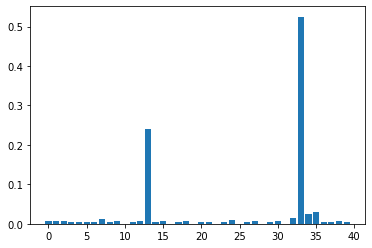

In [216]:
# plot
plt.bar(range(len(train_model1.feature_importances_)), train_model1.feature_importances_)
plt.show()

## 10.	Jelaskan Fitur apa saja yang paling berpengaruh pada model anda dan berapa banyak pelanggan yang akan churn di bulan berikutnya

In [218]:
from xgboost import plot_importance

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

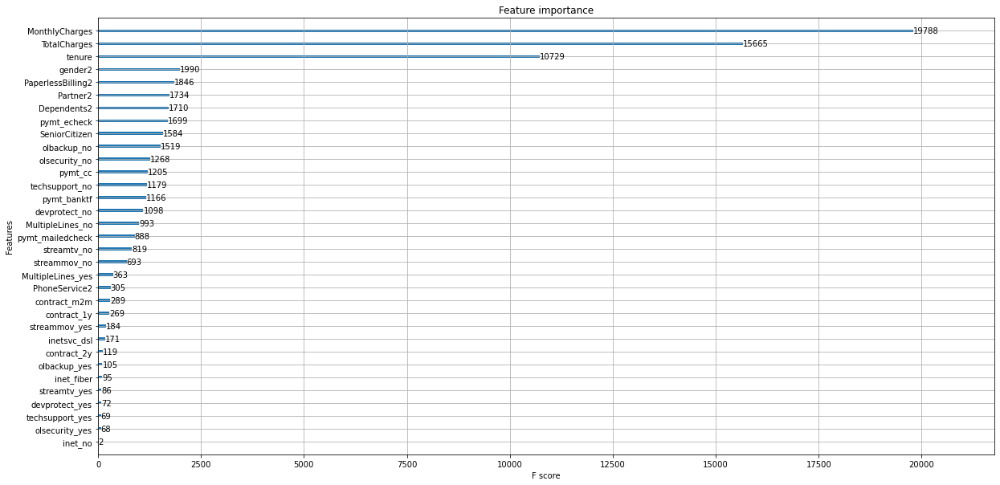

In [224]:
plt.rcParams["figure.figsize"] = (20, 10)
plot_importance(train_model1)

In [225]:
df_input_mdl.describe()

,Churn2,tenure,MonthlyCharges,TotalCharges,gender2,SeniorCitizen,Partner2,Dependents2,PhoneService2,PaperlessBilling2,MultipleLines_no,MultipleLines_no_ph_svc,MultipleLines_yes,inetsvc_dsl,inet_fiber,inet_no,olsecurity_no,olsecurity_noinet,olsecurity_yes,olbackup_no,olbackup_noinet,olbackup_yes,devprotect_no,devprotect_noinet,devprotect_yes,techsupport_no,techsupport_noinet,techsupport_yes,streamtv_no,streamtv_noinet,streamtv_yes,streammov_no,streammov_noinet,streammov_yes,contract_m2m,contract_1y,contract_2y,pymt_banktf,pymt_cc,pymt_echeck,pymt_mailedcheck
count,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000
mean,0.265785,32.421786,64.798208,2283.300441,0.504693,0.162400,0.482509,0.298493,0.903299,0.592719,0.481371,0.096701,0.421928,0.343572,0.440273,0.216155,0.497298,0.216155,0.286547,0.438993,0.216155,0.344852,0.439989,0.216155,0.343857,0.493743,0.216155,0.290102,0.399460,0.216155,0.384386,0.395478,0.216155,0.388367,0.551052,0.209329,0.239619,0.219283,0.216297,0.336320,0.228100
std,0.441782,24.545260,30.085974,2266.771362,0.500014,0.368844,0.499729,0.457629,0.295571,0.491363,0.499688,0.295571,0.493902,0.474934,0.496455,0.411650,0.500028,0.411650,0.452180,0.496300,0.411650,0.475354,0.496421,0.411650,0.475028,0.499996,0.411650,0.453842,0.489822,0.411650,0.486484,0.488988,0.411650,0.487414,0.497422,0.406858,0.426881,0.413790,0.411748,0.472483,0.419637
min,0.000000,1.000000,18.250000,18.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,9.000000,35.587500,401.450000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,29.000000,70.350000,1397.475000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,55.000000,89.862500,3794.737500,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,72.000000,118.750000,8684.800000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [226]:
df_simulation = df_input_mdl.copy()
df_simulation['tenure'] = df_input_mdl['tenure'] + 1

In [227]:
df_simulation.describe()

,Churn2,tenure,MonthlyCharges,TotalCharges,gender2,SeniorCitizen,Partner2,Dependents2,PhoneService2,PaperlessBilling2,MultipleLines_no,MultipleLines_no_ph_svc,MultipleLines_yes,inetsvc_dsl,inet_fiber,inet_no,olsecurity_no,olsecurity_noinet,olsecurity_yes,olbackup_no,olbackup_noinet,olbackup_yes,devprotect_no,devprotect_noinet,devprotect_yes,techsupport_no,techsupport_noinet,techsupport_yes,streamtv_no,streamtv_noinet,streamtv_yes,streammov_no,streammov_noinet,streammov_yes,contract_m2m,contract_1y,contract_2y,pymt_banktf,pymt_cc,pymt_echeck,pymt_mailedcheck
count,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000,7032.000000
mean,0.265785,33.421786,64.798208,2283.300441,0.504693,0.162400,0.482509,0.298493,0.903299,0.592719,0.481371,0.096701,0.421928,0.343572,0.440273,0.216155,0.497298,0.216155,0.286547,0.438993,0.216155,0.344852,0.439989,0.216155,0.343857,0.493743,0.216155,0.290102,0.399460,0.216155,0.384386,0.395478,0.216155,0.388367,0.551052,0.209329,0.239619,0.219283,0.216297,0.336320,0.228100
std,0.441782,24.545260,30.085974,2266.771362,0.500014,0.368844,0.499729,0.457629,0.295571,0.491363,0.499688,0.295571,0.493902,0.474934,0.496455,0.411650,0.500028,0.411650,0.452180,0.496300,0.411650,0.475354,0.496421,0.411650,0.475028,0.499996,0.411650,0.453842,0.489822,0.411650,0.486484,0.488988,0.411650,0.487414,0.497422,0.406858,0.426881,0.413790,0.411748,0.472483,0.419637
min,0.000000,2.000000,18.250000,18.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,10.000000,35.587500,401.450000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,30.000000,70.350000,1397.475000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,56.000000,89.862500,3794.737500,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,73.000000,118.750000,8684.800000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [228]:
print(df_simulation.shape)

(7032, 41)


In [229]:
X_simulation = df_simulation.drop(['Churn2'], axis = 1)
y_simulation = df_simulation.Churn2

In [230]:
pred_y_simulation = train_model1.predict(X_simulation)

In [232]:
len(pred_y_simulation)

7032

In [233]:
sum(pred_y_simulation)

2066

In [251]:
df_sim_out = pd.DataFrame([sum(pred_y_simulation), len(pred_y_simulation)-sum(pred_y_simulation)])
df_sim_out.rename(columns= {0:'Count'}, inplace = True)
df_sim_out['Churn'] = ["Yes", "No"]
df_sim_out.set_index('Churn', inplace = True)
df_sim_out

,Count
Churn,
Yes,2066
No,4966


In [252]:
df_sim_out.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2 entries, Yes to No
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   Count   2 non-null      int64
dtypes: int64(1)
memory usage: 32.0+ bytes


In [254]:
df_sim_pct = df_sim_out['Count']*100/(df_sim_out['Count'].sum())
df_sim_pct

Churn
Yes    29.379977
No     70.620023
Name: Count, dtype: float64

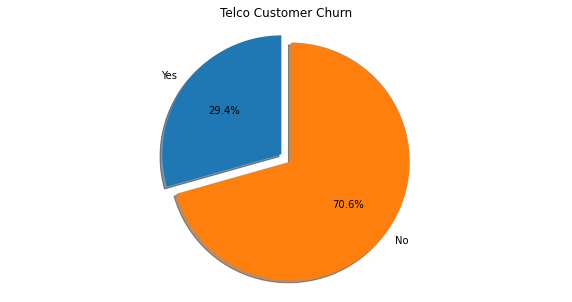

In [255]:
plt.rcParams["figure.figsize"] = (10, 5)
labels = ['Yes', 'No']
sizes = [df_sim_pct[0], df_sim_pct[1]]
explode = (0, 0.1)  # only "explode" the 2nd slice 

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Telco Customer Churn')
plt.show()

In [222]:
pd.DataFrame([X_train.columns, train_model1.feature_importances_])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39
0,tenure,MonthlyCharges,TotalCharges,gender2,SeniorCitizen,Partner2,Dependents2,PhoneService2,PaperlessBilling2,MultipleLines_no,MultipleLines_no_ph_svc,MultipleLines_yes,inetsvc_dsl,inet_fiber,inet_no,olsecurity_no,olsecurity_noinet,olsecurity_yes,olbackup_no,olbackup_noinet,olbackup_yes,devprotect_no,devprotect_noinet,devprotect_yes,techsupport_no,techsupport_noinet,techsupport_yes,streamtv_no,streamtv_noinet,streamtv_yes,streammov_no,streammov_noinet,streammov_yes,contract_m2m,contract_1y,contract_2y,pymt_banktf,pymt_cc,pymt_echeck,pymt_mailedcheck
1,0.00726,0.006345,0.007052,0.005272,0.004955,0.004884,0.004879,0.012037,0.005615,0.005886,0.0,0.00443,0.006779,0.240745,0.005067,0.007852,0.0,0.004533,0.005944,0.0,0.004326,0.005721,0.0,0.003917,0.009576,0.0,0.005295,0.005937,0.0,0.003767,0.005858,0.0,0.015837,0.524839,0.025225,0.028988,0.004724,0.004657,0.006037,0.005763


In [ ]:
import numpy as np
from scipy.stats import norm
from sklearn.linear_model import LogisticRegression

def logit_pvalue(model, x):
    """ Calculate z-scores for scikit-learn LogisticRegression.
    parameters:
        model: fitted sklearn.linear_model.LogisticRegression with intercept and large C
        x:     matrix on which the model was fit
    This function uses asymtptics for maximum likelihood estimates.
    """
    p = model.predict_proba(x)
    n = len(p)
    m = len(model.coef_[0]) + 1
    coefs = np.concatenate([model.intercept_, model.coef_[0]])
    x_full = np.matrix(np.insert(np.array(x), 0, 1, axis = 1))
    ans = np.zeros((m, m))
    for i in range(n):
        ans = ans + np.dot(np.transpose(x_full[i, :]), x_full[i, :]) * p[i,1] * p[i, 0]
    vcov = np.linalg.inv(np.matrix(ans))
    se = np.sqrt(np.diag(vcov))
    t =  coefs/se  
    p = (1 - norm.cdf(abs(t))) * 2
    return p

# test p-values
x = np.arange(10)[:, np.newaxis]
y = np.array([0,0,0,1,0,0,1,1,1,1])
model = LogisticRegression(C=1e30).fit(x, y)
print(logit_pvalue(model, x))

# compare with statsmodels
import statsmodels.api as sm
sm_model = sm.Logit(y, sm.add_constant(x)).fit(disp=0)
print(sm_model.pvalues)
sm_model.summary()